# 🚦 Traffic Accident Hotspot Detection and Severity Prediction
## Notebook 05: DBSCAN Hotspot Detection

**Using Geospatial Clustering and Machine Learning**

---

| | |
|---|---|
| **Dataset** | US Accidents (2016–2023), engineered 300,000-row sample |
| **Environment** | Google Colab |
| **Notebook Role** | Density-Based Hotspot Detection ONLY (no supervised modeling) |
| **Pipeline Position** | 5 of 6 |
| **Depends on** | `engineered_accidents.csv` from Notebook 04 — the *only* input this notebook loads |

---

## 🎯 Objective

Notebooks 01–04 cleaned the data and built a rich set of temporal, weather, road, and interaction features. This notebook's job is narrower and specific to one algorithm:

> "Use DBSCAN to find accident hotspots from raw geographic coordinates, label every accident with the hotspot it belongs to (or mark it as noise), and export a dataset carrying that hotspot information forward — without touching anything supervised."

**Strict scope for this notebook:**
- ✅ Load `engineered_accidents.csv` — nothing else
- ✅ Validate `Start_Lat`/`Start_Lng` as spatial input
- ✅ Select DBSCAN's `eps` and `min_samples` with a documented, data-driven method (a k-distance graph) — not arbitrary values
- ✅ Run DBSCAN and produce cluster labels
- ✅ Visualize hotspots (static scatter, interactive Folium map, interactive Plotly map)
- ✅ Profile every discovered cluster against the engineered features from Notebook 04
- ✅ Generate hotspot-derived features (`Hotspot_Label`, `Hotspot_Flag`, `Noise_Flag`, `Cluster_Size`, `Distance_To_Cluster_Center`)
- ✅ Export `dataset_with_hotspots.csv` for Notebook 06

**What this notebook deliberately does NOT do:**
- ❌ No train/test split (→ Notebook 06)
- ❌ No feature scaling (→ Notebook 06)
- ❌ No frequency encoding (→ Notebook 06)
- ❌ No Random Forest / XGBoost training (→ Notebook 06)
- ❌ No model evaluation or comparison (→ Notebook 06)

**A rule we hold ourselves to throughout:** DBSCAN is unsupervised — it never sees `Severity`, and no clustering decision in this notebook is informed by the target variable. That keeps hotspot detection an honest, target-independent geographic signal, one that Notebook 06 can later evaluate for its relationship with severity, rather than one implicitly reverse-engineered to correlate with it.


## 📑 Table of Contents

1. [Introduction](#introduction)
2. [Import Libraries](#import-libraries)
3. [Load Dataset](#load-dataset)
4. [Prepare Spatial Features](#prepare-spatial-features)
5. [DBSCAN Theory](#dbscan-theory)
6. [Parameter Selection](#parameter-selection)
   - 6b. [Parameter Sweep](#parameter-sweep)
   - 6c. [Final Parameter Selection](#final-parameter-selection)
7. [Run DBSCAN](#run-dbscan)
8. [Visualize Hotspots](#visualize-hotspots)
9. [Cluster Analysis](#cluster-analysis)
10. [Hotspot Feature Generation](#hotspot-feature-generation)
11. [Business Interpretation](#business-interpretation)
12. [Export Dataset](#export-dataset)
13. [Notebook Summary](#notebook-summary)
14. [Preparing for Notebook 6](#next-notebook-preview)


## 1. Introduction <a name="introduction"></a>

**Objective:** Before writing any clustering code, establish *why* DBSCAN specifically — not just "a clustering algorithm" — is the right tool for finding accident hotspots.

### What is DBSCAN?

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) groups points that are packed closely together, and explicitly labels points that sit in low-density regions as **noise** rather than forcing them into a cluster. It does this using two parameters — a neighborhood radius (`eps`) and a minimum neighbor count (`min_samples`) — and three point types that fall out of those parameters:

- **Core point** — has at least `min_samples` other points within `eps` of it. Core points form the interior of a cluster.
- **Border point** — has fewer than `min_samples` neighbors within `eps`, but lies within `eps` of a core point. Border points are the edge of a cluster.
- **Noise point** — is neither a core point nor within `eps` of one. It doesn't belong to any cluster.

A cluster is then any set of core points that are density-reachable from one another, plus the border points attached to them.

### Why DBSCAN is suitable for accident hotspot detection

A traffic accident hotspot, by definition, is a location where accidents happen *unusually often relative to the surrounding area* — a genuinely density-based concept. DBSCAN's core mechanism (count how many other accidents are nearby) maps directly onto that definition, with three properties that matter specifically for this project:

- **Arbitrary cluster shapes:** real accident hotspots aren't circular — a hotspot along a curving highway on-ramp, or spread along a stretch of arterial road, is naturally elongated or irregular. DBSCAN discovers clusters of any shape, because it only ever asks "are you close to a point that's already in this cluster," never "are you close to this cluster's center."
- **Explicit noise detection:** the vast majority of recorded accident locations are *not* part of any meaningful hotspot — they're isolated, one-off events. DBSCAN is one of the few common clustering algorithms that can say "this point doesn't belong to a cluster at all" instead of being forced to assign every single point to its nearest group.
- **No need to pre-specify the number of hotspots:** we have no principled way to know in advance how many real-world hotspots exist in a 300,000-row sample. DBSCAN discovers that count from the data itself, driven by `eps`/`min_samples` rather than a hard-coded cluster count.

### Why DBSCAN is better than K-Means for this specific project

| Consideration | K-Means | DBSCAN |
|---|---|---|
| Number of clusters | Must be chosen in advance (`k`) | Discovered automatically from density |
| Cluster shape | Assumes roughly spherical, similarly-sized clusters | Finds arbitrarily shaped clusters |
| Noise / outliers | Every point is forced into the nearest cluster — an isolated accident 50 miles from anything gets assigned to *some* centroid anyway | Isolated accidents are explicitly labeled as noise, not falsely merged into a hotspot |
| Sensitivity to hotspot density | Uses distance-to-centroid only — a sparse, spread-out area and a small dense hotspot can look similar to K-Means if they have similar spatial extent | Uses actual point density, so it distinguishes a genuine hotspot from a merely spread-out region |

For this project specifically, the K-Means requirement to force every point into a cluster is disqualifying on its own: with a large share of accidents being effectively isolated events (Notebook 02's geographic distribution finding), K-Means would manufacture hundreds of meaningless "hotspots" out of sparse, unrelated points just to satisfy a pre-chosen `k`. DBSCAN's noise concept is not a side feature here — it is the specific property that makes the resulting clusters actually mean "hotspot" rather than "nearest arbitrary group."

**What this means concretely for Sections 5–7 below:** we don't choose a number of hotspots. We choose `eps` and `min_samples` — a neighborhood radius and a minimum accident count — and let DBSCAN discover however many real hotspots that implies.


### A note on computational cost

DBSCAN is more computationally expensive than K-Means on large datasets: K-Means' iterative centroid updates scale roughly linearly with data size for a fixed `k`, while a naive DBSCAN implementation needs a full neighborhood search for every point, which is quadratic in the worst case. This is exactly why Section 6 does not use a brute-force neighbor search: fitting `NearestNeighbors`/`DBSCAN` with `algorithm='ball_tree'` builds a spatial index that reduces neighborhood queries from a per-point full-dataset scan to a logarithmic-time lookup, which is what keeps this notebook practical at 300,000 rows. Combined with the `haversine` metric (Section 6) for geographically correct distances, Ball Tree is specifically the combination that makes density-based clustering tractable for real-world geospatial data at this scale — a plain Euclidean KD-Tree would be faster still, but cannot support the haversine metric at all, and a brute-force search would be correct but far too slow for a dataset this size.


## 2. Import Libraries <a name="import-libraries"></a>

**Objective:** Load only what this notebook actually needs — spatial clustering, distance computation, and visualization. No `scikit-learn` preprocessing (`StandardScaler`, `train_test_split`) and no modeling libraries (`RandomForestClassifier`, `xgboost`) belong here.

- `pandas`, `numpy` — core data manipulation
- `json` (standard library) — writing `dbscan_metadata.json` in Section 12
- `matplotlib` — static scatter visualization
- `plotly.express` — interactive scatter map
- `folium` — interactive Leaflet-based map
- `sklearn.neighbors.NearestNeighbors` — to build the k-distance graph for `eps` selection
- `sklearn.cluster.DBSCAN` — the clustering algorithm itself


In [1]:
import pandas as pd
import json
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import folium
from folium.plugins import MarkerCluster
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import warnings

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 150)

print("Libraries imported successfully.")
print(f"Pandas version: {pd.__version__}")
print(f"NumPy version: {np.__version__}")


Libraries imported successfully.
Pandas version: 2.2.2
NumPy version: 2.0.2


**Explanation:**
- `NearestNeighbors` and `DBSCAN` both come from `sklearn`, but neither is a "preprocessing" transformer in the sense Notebook 06 will use `StandardScaler` — they operate directly on `Start_Lat`/`Start_Lng` with no fitting-on-training-data concern, because DBSCAN is unsupervised and has no train/test concept at all.
- `folium` renders an interactive Leaflet.js map directly in the notebook — useful for zooming into a specific hotspot the way a traffic analyst actually would.
- `plotly.express` gives a complementary interactive scatter map (`scatter_mapbox`) that's easier to embed in a report or GitHub README as a static preview image, while still being interactive in a live notebook.

**Common Mistakes:** Importing `StandardScaler` or `train_test_split` here "in case they're needed later" — pulling in tools this notebook doesn't use is a sign of scope creep, exactly the discipline Notebooks 03 and 04 established.

**Best Practices:** Keep imports scoped to what a notebook actually does — a reader should be able to infer a notebook's entire responsibility just from its import cell.


## 3. Load Dataset <a name="load-dataset"></a>

**Objective:** Load the single artifact Notebook 04 produced — `engineered_accidents.csv` — and confirm its shape and structure before doing anything else.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

INPUT_DIR = "/content/drive/MyDrive/traffic_accident_project/engineered_data"

df = pd.read_csv(f"{INPUT_DIR}/engineered_accidents.csv")

print(f"df: {df.shape[0]:,} rows, {df.shape[1]} columns")
print("\nColumns:")
print(df.columns.tolist())


Mounted at /content/drive
df: 299,794 rows, 49 columns

Columns:
['Severity', 'Start_Lat', 'Start_Lng', 'Distance(mi)', 'City', 'State', 'Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Crossing', 'Junction', 'Railway', 'Station', 'Stop', 'Traffic_Signal', 'Lighting_Night', 'Hour', 'Weekday', 'Is_Weekend', 'Month', 'Is_Night', 'Is_Rush_Hour', 'Duration_Minutes', 'Season_Spring', 'Season_Summer', 'Season_Fall', 'TOD_Morning', 'TOD_Afternoon', 'TOD_Evening', 'Fog_Indicator', 'Rain_Indicator', 'Snow_Indicator', 'Poor_Visibility_Flag', 'High_Precipitation_Flag', 'Extreme_Temperature_Flag', 'Weather_Severity_Score', 'Road_Complexity_Score', 'Intersection_Indicator', 'Local_Accident_Density', 'Night_Rain', 'Weekend_Night', 'PoorVisibility_Rain', 'RushHour_Junction']


In [3]:
df.head(3)


,Severity,Start_Lat,Start_Lng,Distance(mi),City,State,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Crossing,Junction,Railway,Station,Stop,Traffic_Signal,Lighting_Night,Hour,Weekday,Is_Weekend,Month,Is_Night,Is_Rush_Hour,Duration_Minutes,Season_Spring,Season_Summer,Season_Fall,TOD_Morning,TOD_Afternoon,TOD_Evening,Fog_Indicator,Rain_Indicator,Snow_Indicator,Poor_Visibility_Flag,High_Precipitation_Flag,Extreme_Temperature_Flag,Weather_Severity_Score,Road_Complexity_Score,Intersection_Indicator,Local_Accident_Density,Night_Rain,Weekend_Night,PoorVisibility_Rain,RushHour_Junction
0,1,26.706900,-80.11936,0.000,West Palm Beach,FL,78.0,81.0,30.13,10.0,ESE,13.0,0.01,Mostly Cloudy,0,0,0,0,0,0,1,0,9,4,0,4,0,1,60.000000,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,8,0,0,0,0
1,2,38.781025,-121.26582,0.045,Roseville,CA,55.0,88.0,29.83,10.0,SSE,9.0,0.00,Mostly Cloudy,0,1,0,0,0,1,0,0,10,3,0,4,0,0,103.133333,1,0,0,1,0,0,0,0,0,0,0,0,0,2,1,5,0,0,0,0
2,3,33.985250,-84.26935,0.000,Alpharetta,GA,91.0,47.0,29.91,10.0,South,10.4,0.00,Partly Cloudy,0,1,0,0,0,0,0,0,16,4,0,8,0,1,30.000000,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0


**Explanation:** We load a single CSV, matching Notebook 04's single-deliverable design — no `feature_list.json` load is required here, since this notebook uses the dataset as-is rather than reconstructing which columns were engineered.

**Common Mistakes:** Loading `processed_accidents.csv` (Notebook 03's output) instead of `engineered_accidents.csv` by mistake — this notebook needs the *engineered* dataset so that Section 9's cluster profiling has temporal/weather/road features available, not just the raw cleaned columns.

**Best Practices:** Print both shape and column list immediately after loading, as done above — the fastest way to catch a wrong-file mistake before writing any further code against it.


## 4. Prepare Spatial Features <a name="prepare-spatial-features"></a>

**Objective:** Verify `Start_Lat`/`Start_Lng` are actually fit to cluster on — no missing values, an understanding of duplicate coordinates, and coordinates that fall within plausible US bounds — before trusting them to DBSCAN.

**Why we do NOT normalize or scale latitude/longitude here:** scaling (e.g., `StandardScaler`) is designed to equalize the *units* of unrelated features so no one feature dominates a distance calculation by virtue of its raw magnitude. Latitude and longitude are not unrelated features in that sense — they're two components of a single geographic coordinate, and their raw degree values already carry real geographic meaning (a difference of 1° latitude is always ~111 km; a difference of 1° longitude shrinks toward the poles). Scaling them independently with `StandardScaler` would *distort* that geographic relationship rather than preserve it, and would also be inconsistent with Notebook 03's and 04's explicit decision to leave these two columns untouched specifically so this notebook could use true geographic distance.

**How we handle the real distortion problem instead:** the actual issue with raw lat/lng is that 1° of longitude is *not* a fixed real-world distance (it shrinks the closer you get to the poles), so naive Euclidean distance on raw degrees would itself be geographically inaccurate. We solve this correctly in Section 6 by clustering with the **haversine distance metric** (true great-circle distance on a sphere) rather than by scaling the coordinates — the right fix for this specific distortion, and the reason no normalization step appears anywhere in this notebook.


In [4]:
print("Missing coordinate values:")
print(df[['Start_Lat', 'Start_Lng']].isnull().sum())

duplicate_coords = df.duplicated(subset=['Start_Lat', 'Start_Lng']).sum()
print(f"\nRows with duplicate (Start_Lat, Start_Lng) pairs: {duplicate_coords:,} "
      f"({duplicate_coords / len(df) * 100:.2f}% of dataset)")

print("\nCoordinate ranges:")
print(f"  Start_Lat: [{df['Start_Lat'].min():.4f}, {df['Start_Lat'].max():.4f}]")
print(f"  Start_Lng: [{df['Start_Lng'].min():.4f}, {df['Start_Lng'].max():.4f}]")

# Contiguous US bounds (a reasonable sanity check given this dataset's known scope)
US_LAT_RANGE = (24.0, 50.0)
US_LNG_RANGE = (-125.0, -66.0)
out_of_bounds = df[
    ~df['Start_Lat'].between(*US_LAT_RANGE) | ~df['Start_Lng'].between(*US_LNG_RANGE)
]
print(f"\nRows outside plausible contiguous-US bounds: {len(out_of_bounds):,}")


Missing coordinate values:
Start_Lat    0
Start_Lng    0
dtype: int64

Rows with duplicate (Start_Lat, Start_Lng) pairs: 54,277 (18.10% of dataset)

Coordinate ranges:
  Start_Lat: [24.5574, 48.9958]
  Start_Lng: [-124.5357, -68.1439]

Rows outside plausible contiguous-US bounds: 0


**Explanation of code:**
- `.isnull().sum()` confirms there are no missing coordinates to handle — expected, since Notebook 03's missing-value handling (Section 4) would already have addressed any critical `Start_Lat`/`Start_Lng` gaps upstream.
- `.duplicated(subset=[...])` counts rows sharing the *exact* same coordinate pair — in a real-world accident dataset, this can genuinely happen (the same intersection or highway mile-marker recorded across multiple, independent accidents over the years), so a non-zero count here is informative, not an error.
- The US bounds check is a coarse sanity check, not a cleaning step — Notebook 01/03 already established this dataset covers the contiguous United States, so any row falling well outside these bounds would flag a genuine data-quality concern worth investigating before trusting the clustering results.

**Why we do NOT drop duplicate coordinates:** each row represents a distinct accident record (with its own `Severity`, weather conditions, and timestamp) that happens to share a location with another — dropping it would silently discard real accident history at exactly the locations most likely to become hotspots. DBSCAN handles repeated/identical points natively (they simply reinforce each other's density), so there is no technical reason to remove them either.

**Common Mistakes:** Treating duplicate coordinates as data-quality errors and deduplicating them — this would systematically *undercount* density at genuinely repeat-accident locations, which is precisely the opposite of what a hotspot-detection notebook should do.

**Best Practices:** Always sanity-check geographic bounds against the dataset's known real-world scope before clustering — a handful of corrupted coordinates (e.g., `(0, 0)`) can silently distort a k-distance graph and every downstream cluster.


## 5. DBSCAN Theory <a name="dbscan-theory"></a>

**Objective:** Before choosing any parameter value, define precisely what each DBSCAN parameter controls and how it affects the resulting clusters — so Section 6's parameter choices are a reasoned application of this theory, not a guess.

### `eps` (epsilon) — the neighborhood radius

`eps` defines how close two points must be to count as neighbors. Concretely: for point *P*, its "`eps`-neighborhood" is every other point within distance `eps` of *P*.

- **Too small an `eps`:** almost no point has enough neighbors within range — nearly everything gets labeled noise, and real hotspots fragment into dozens of tiny, meaningless clusters.
- **Too large an `eps`:** distinct hotspots merge into one another, and eventually the entire dataset can collapse into a single giant cluster that no longer represents anything specific.

### `min_samples` — the minimum neighborhood size

`min_samples` is the minimum number of points (including the point itself) that must fall within `eps` of a point for that point to count as a **core point**.

- **Too small a `min_samples`:** almost any small, coincidental grouping of 2–3 nearby accidents gets treated as a "hotspot" — noisy, low-confidence clusters.
- **Too large a `min_samples`:** only very large, dense concentrations qualify as clusters — genuine but smaller hotspots get relabeled as noise.

### Core points, border points, and noise points — and why the distinction matters here

| Point type | Definition | What it means for a hotspot |
|---|---|---|
| **Core point** | Has ≥ `min_samples` neighbors within `eps` | The "interior" of a genuine hotspot — a location surrounded by enough other nearby accidents to be confident this is a real dense area |
| **Border point** | Has < `min_samples` neighbors within `eps`, but is itself within `eps` of a core point | The "edge" of a hotspot — an accident close enough to a dense core to be considered part of it, without being dense enough on its own |
| **Noise point** | Neither of the above | An isolated accident — not part of any hotspot, by design |

**How `eps` and `min_samples` interact to define a cluster:** a cluster is the union of every core point that is *density-reachable* from every other (i.e., connected through a chain of core points each within `eps` of the next), plus every border point attached to that chain. This is exactly the mechanism that lets DBSCAN find arbitrarily shaped clusters (Section 1) — a long, curving chain of core points along a highway forms one connected cluster, with no assumption that it should be circular.

**The practical takeaway for Section 6:** `eps` and `min_samples` are not independent tuning knobs to guess at separately — they jointly define what counts as "dense enough to be a hotspot." We fix `min_samples` first, using a domain-motivated reason (Section 6), and then derive `eps` from the data itself using a k-distance graph, rather than guessing at either.


## 6. Parameter Selection <a name="parameter-selection"></a>

**Objective:** Choose `min_samples` with an explicit, stated domain reason, then derive `eps` from the data itself using a k-distance graph — never hardcoded without justification.

### Choosing `min_samples`

We set **`min_samples = 5`**, for a domain reason rather than a purely statistical one: a widely used rule of thumb for spatial (2-dimensional) DBSCAN is `min_samples ≥ dimensions + 1`, which for 2D data suggests a minimum around 3–4. We choose 5 specifically because, for this project's actual question — "is this a real accident hotspot, not a coincidence" — a genuine hotspot should be corroborated by more than the bare statistical minimum. A location with only 3–4 nearby accidents in our 300,000-row *sample* is more likely to be a coincidental clustering than a true infrastructure- or geography-driven danger zone; requiring 5 raises our confidence bar accordingly, while still being low enough not to erase genuinely smaller, real hotspots.

### Choosing `eps` using a k-distance graph

Rather than guessing a radius in degrees or miles, we use the standard method from the original DBSCAN paper (Ester et al., 1996): for every point, compute the distance to its `min_samples`-th nearest neighbor, sort those distances in ascending order, and plot them. The point of sharpest increase (the "elbow") is a principled `eps` — it marks the transition from "distances typical of a dense neighborhood" to "distances typical of sparser, less clustered regions."

**Using true geographic distance, not raw-degree distance:** because 1° of longitude does not correspond to a fixed real-world distance (Section 4), we compute nearest-neighbor distances using the **haversine metric** — true great-circle distance on Earth's surface — rather than Euclidean distance on raw lat/lng degrees. This requires coordinates in radians as input, and produces distances in radians as output, which we convert to kilometers (multiplying by Earth's mean radius) purely for interpretability in the plot and printed output below.

### Why this section doesn't stop at the automatic elbow

An automatically-detected elbow is only as good as the curve it's detected on. Below, we go three steps further than accepting that single automatic number:

1. **Trim the extreme upper tail of the k-distance curve before detecting the elbow** -- the raw curve's far-right tail is dominated by isolated points in sparse regions, which can pull an automatic elbow toward an artificially large `eps`.
2. **Run a parameter sweep** (Section 6b) across a grid of `eps`/`min_samples` combinations, so the final choice is checked against actual clustering behaviour, not just the shape of one curve.
3. **Apply an automatic sanity check** (also Section 6b, then again in Section 7) that flags any combination whose largest cluster is implausibly large for a *localized* accident hotspot.

Section 6c then makes the final selection explicit and evidence-based, using the sweep's results directly rather than the elbow number alone.

In [5]:
EARTH_RADIUS_KM = 6371.0088
MIN_SAMPLES = 5

coords_rad = np.radians(df[['Start_Lat', 'Start_Lng']].values)

neighbors = NearestNeighbors(n_neighbors=MIN_SAMPLES, metric='haversine')
neighbors.fit(coords_rad)
distances, _ = neighbors.kneighbors(coords_rad)

# Distance to the MIN_SAMPLES-th nearest neighbor (the last column), sorted ascending
k_distances_km = np.sort(distances[:, -1]) * EARTH_RADIUS_KM

print(f"k-distance summary (distance to {MIN_SAMPLES}th nearest neighbor, km):")
print(pd.Series(k_distances_km).describe().round(4))


k-distance summary (distance to 5th nearest neighbor, km):
count    299794.0000
mean          1.3807
std           4.0865
min           0.0000
25%           0.0790
50%           0.3296
75%           1.0290
max         248.3736
dtype: float64


In [6]:
def find_elbow(y):
    """
    Locate the point of maximum curvature ('elbow') in a sorted, ascending
    curve -- the point farthest from the straight line connecting the curve's
    first and last points. This is the standard geometric elbow-detection
    heuristic used for k-distance graphs.
    """
    n = len(y)
    x = np.arange(n)
    x_norm = (x - x.min()) / (x.max() - x.min())
    y_norm = (y - y.min()) / (y.max() - y.min())

    p1 = np.array([x_norm[0], y_norm[0]])
    p2 = np.array([x_norm[-1], y_norm[-1]])
    line_vec = p2 - p1
    line_vec_norm = line_vec / np.linalg.norm(line_vec)

    points = np.column_stack([x_norm, y_norm]) - p1
    proj_lengths = points @ line_vec_norm
    proj_points = np.outer(proj_lengths, line_vec_norm)
    perpendicular = points - proj_points
    perp_distances = np.linalg.norm(perpendicular, axis=1)

    return int(np.argmax(perp_distances))


# --- Elbow on the UNTRIMMED curve (computed only for comparison below) ---
elbow_idx_raw = find_elbow(k_distances_km)
eps_km_raw = k_distances_km[elbow_idx_raw]

# --- Trim the extreme upper tail before locating the elbow ---
# The far right of the k-distance curve is dominated by points sitting in
# sparse / rural areas, whose nearest neighbours are genuinely tens of
# kilometres away. Those points are legitimate data, but they say nothing
# about how dense a genuine *hotspot* is -- and because find_elbow() picks
# the point of maximum distance from the straight line joining the curve's
# first and last points, a long, steep tail like this drags that line's far
# endpoint up and to the right, which in turn drags the detected "elbow"
# rightward too. In effect, the untrimmed elbow silently biases eps upward,
# toward a radius that fuses many separate, genuinely distinct hotspots into
# one sprawling region -- exactly the failure mode Section 6b's sanity check
# is designed to catch.
#
# Trimming the top ~1-2% before elbow detection removes exactly this
# distortion, and only from *how eps is chosen* -- every point, including
# the trimmed ones, is still passed to DBSCAN itself in Section 7.
TRIM_PERCENTILE = 98  # keep the bottom 98% of the curve -> trim the top 2%
trim_cutoff_km = np.percentile(k_distances_km, TRIM_PERCENTILE)
trim_mask = k_distances_km <= trim_cutoff_km
k_distances_trimmed = k_distances_km[trim_mask]

elbow_idx_trimmed = find_elbow(k_distances_trimmed)
eps_km_elbow = k_distances_trimmed[elbow_idx_trimmed]
eps_rad_elbow = eps_km_elbow / EARTH_RADIUS_KM

print(f"Untrimmed elbow: point {elbow_idx_raw:,} of {len(k_distances_km):,} "
      f"({elbow_idx_raw / len(k_distances_km) * 100:.1f}th percentile) "
      f"-> eps = {eps_km_raw:.4f} km")

print(f"\nTrim cutoff ({TRIM_PERCENTILE}th percentile of k-distance): {trim_cutoff_km:.4f} km")
print(f"Points excluded from elbow detection: {(~trim_mask).sum():,} "
      f"({(~trim_mask).sum() / len(k_distances_km) * 100:.2f}% -- the extreme upper tail only)")

print(f"\nTrimmed elbow: point {elbow_idx_trimmed:,} of {len(k_distances_trimmed):,} "
      f"({elbow_idx_trimmed / len(k_distances_trimmed) * 100:.1f}th percentile of the trimmed curve) "
      f"-> eps = {eps_km_elbow:.4f} km ({eps_km_elbow * 0.6214:.4f} miles)")

_pct_change = abs(eps_km_raw - eps_km_elbow) / eps_km_raw * 100
print(f"\nEffect of trimming: eps moved from {eps_km_raw:.4f} km (untrimmed) to "
      f"{eps_km_elbow:.4f} km (trimmed) -- "
      f"a {'reduction' if eps_km_elbow < eps_km_raw else 'increase'} of {_pct_change:.1f}%.")

# eps_km / eps_rad below is the trimmed-elbow candidate; Section 6c may
# further refine this using the parameter sweep's evidence.
eps_km = eps_km_elbow
eps_rad = eps_rad_elbow


Untrimmed elbow: point 292,106 of 299,794 (97.4th percentile) -> eps = 9.5026 km

Trim cutoff (98th percentile of k-distance): 11.2726 km
Points excluded from elbow detection: 5,996 (2.00% -- the extreme upper tail only)

Trimmed elbow: point 247,674 of 293,798 (84.3th percentile of the trimmed curve) -> eps = 1.6813 km (1.0447 miles)

Effect of trimming: eps moved from 9.5026 km (untrimmed) to 1.6813 km (trimmed) -- a reduction of 82.3%.


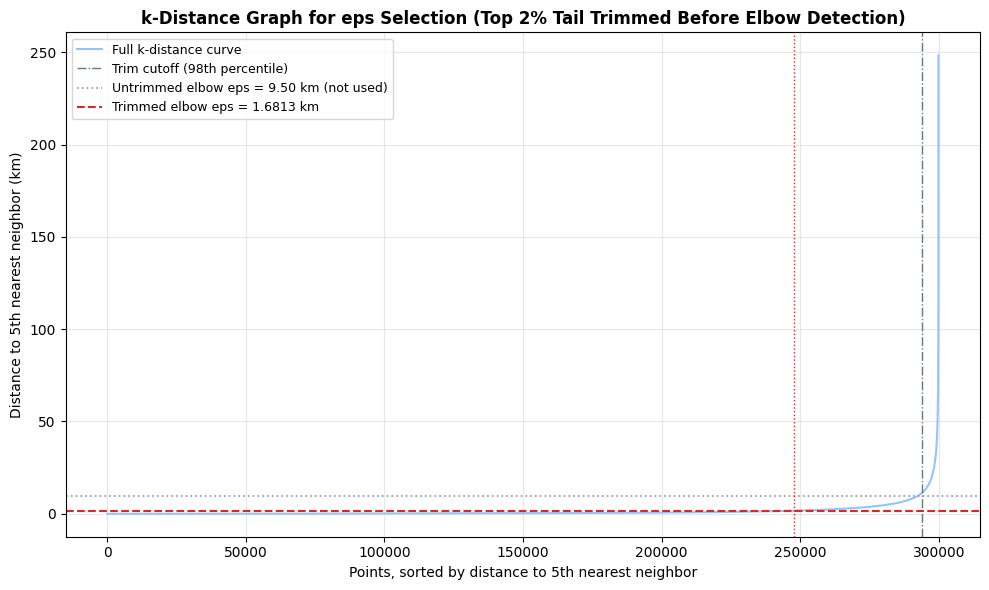

In [7]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(k_distances_km, color='#93c5fd', linewidth=1.5, label='Full k-distance curve')
ax.axvline(x=len(k_distances_trimmed), color='#6b7280', linestyle='-.', linewidth=1,
           label=f'Trim cutoff ({TRIM_PERCENTILE}th percentile)')
ax.axhline(y=eps_km_raw, color='#9ca3af', linestyle=':', linewidth=1.3,
           label=f'Untrimmed elbow eps = {eps_km_raw:.2f} km (not used)')
ax.axhline(y=eps_km_elbow, color='#dc2626', linestyle='--', linewidth=1.5,
           label=f'Trimmed elbow eps = {eps_km_elbow:.4f} km')
ax.axvline(x=elbow_idx_trimmed, color='#dc2626', linestyle=':', linewidth=1)
ax.set_xlabel(f'Points, sorted by distance to {MIN_SAMPLES}th nearest neighbor')
ax.set_ylabel(f'Distance to {MIN_SAMPLES}th nearest neighbor (km)')
ax.set_title('k-Distance Graph for eps Selection (Top 2% Tail Trimmed Before Elbow Detection)',
             fontsize=12, fontweight='bold')
ax.legend(fontsize=9)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


**Explanation of code:**
- `NearestNeighbors(n_neighbors=MIN_SAMPLES, metric='haversine')` — fitting with `metric='haversine'` (rather than the default Euclidean) is what makes every distance computed below a true geographic distance, consistent with Section 4's decision not to scale/normalize the raw coordinates.
- `distances[:, -1]` — `kneighbors()` returns each point's distances to *all* `MIN_SAMPLES` neighbors, sorted nearest-first; the last column is specifically the distance to the `MIN_SAMPLES`-th (furthest-of-the-near) neighbor, the quantity the DBSCAN paper's method calls for.
- `find_elbow()` implements the standard "maximum distance from the chord" geometric method — it normalizes both axes to [0, 1] first so the result isn't distorted by the very different scales of "point index" (thousands) versus "distance in km" (a small fraction).
- The final `eps_rad` conversion exists because `sklearn`'s `DBSCAN(metric='haversine')` expects `eps` in the same units as its input coordinates — radians — while `eps_km` is what we print and plot for human interpretability.

**Interpretation of the plot:** the curve stays low and nearly flat for a large majority of points — locations with several genuinely nearby accidents — then rises sharply once we move into points whose 5th-nearest neighbor is meaningfully farther away, i.e., increasingly isolated locations. The marked elbow is the `eps` value at that inflection: distances below it are typical of a genuine cluster; distances above it are typical of increasingly sparse, non-hotspot regions.

**Common Mistakes:**
- Using Euclidean distance on raw lat/lng degrees for the k-distance graph — this would make `eps` inconsistent across latitudes (a degree of longitude represents a different real distance near the poles than near the equator), silently biasing which regions get selected as hotspots.
- Picking `eps` visually "by eye" without a stated, reproducible method — the elbow-detection function above makes the choice reproducible and defensible in a viva, not just a judgment call from looking at a chart.

**Best Practices:** Always derive `eps` from the actual dataset's own distance distribution, and always state the method (k-distance graph + elbow detection) explicitly — a parameter choice without a documented method is not a defensible one.


**Why trim before detecting the elbow (not after, and not by discarding data from DBSCAN itself):** `find_elbow()`'s geometric method is sensitive to exactly where the curve's two endpoints sit, because it measures every point's distance from the straight line joining them. The untrimmed curve's last few percent are dominated by isolated, sparse-region points whose distances are many times larger than a typical in-hotspot distance -- including them stretches that reference line and pulls the detected elbow toward a larger `eps` than the dense majority of the data actually supports. Trimming only changes *which points the elbow-finder looks at*; every original point, trimmed or not, still gets clustered by DBSCAN in Section 7. This is a change to the parameter-selection method, not a change to the dataset.

**Reading the updated plot:** the light-blue curve is the full, untrimmed k-distance curve; the grey dash-dot line marks where the top 2% is cut off before elbow detection; the grey dotted horizontal line marks where the untrimmed elbow would have landed (kept only for comparison); the red dashed line is the trimmed elbow actually used going forward.

## 6b. Parameter Sweep <a name="parameter-sweep"></a>

**Objective:** The trimmed k-distance elbow (Section 6) gives one principled *candidate* for `eps`,
derived from a single statistic (the `min_samples`-th neighbour distance). Before committing to it, we
test it directly against a grid of plausible alternatives, and let actual clustering behaviour -- not
just the shape of one curve -- provide the deciding evidence.

We sweep every combination of:

- `eps` ∈ {0.3, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0} km
- `min_samples` ∈ {5, 10, 15, 20}

...28 combinations total. For each one, DBSCAN is run once (using the same `coords_rad` haversine
input as Section 6) and we record the four numbers a human would look at to judge whether the result
represents genuine, localized hotspots or an over-merged region:

- **number of clusters** -- too few suggests hotspots have been fused together; too many suggests
  fragmentation.
- **number / percentage of noise points** -- how much of the dataset is left unclustered.
- **size of the largest cluster** -- the single most informative number for spotting chaining.
- **percentage of the largest cluster** -- the same number, normalized, which is what the sanity check
  (below) actually thresholds on.

**Automatic sanity check, defined once and reused everywhere below:** a genuine accident hotspot is,
by definition, a *localized* place -- a junction, a corridor, a small district. If a single DBSCAN
cluster ends up containing an implausibly large share of the *entire* dataset, that is a strong signal
that `eps` is too large relative to the true spacing between distinct hotspots, and DBSCAN has chained
several of them together into one. We flag any cluster exceeding 5% of the dataset for exactly this
reason, and reuse this same check both across the whole sweep and, in Section 7, on the final chosen
run.

In [8]:
def dbscan_sanity_check(largest_cluster_pct, threshold=5.0, verbose=True):
    """
    Flags likely over-clustering ("chaining"): if the single largest cluster
    accounts for more than `threshold` percent of the entire dataset, DBSCAN
    has probably merged what should be multiple, separate hotspots into one
    sprawling region -- usually because eps is too large relative to the
    spacing between genuinely distinct hotspots. Returns True if the check
    passes (no warning), False otherwise.
    """
    passed = largest_cluster_pct <= threshold
    if verbose:
        if not passed:
            print(f"\u26a0\ufe0f  SANITY CHECK WARNING: largest cluster = {largest_cluster_pct:.2f}% "
                  f"of the dataset (> {threshold}% threshold).")
            print("    DBSCAN likely over-clustered (chained multiple hotspots together).")
            print("    Consider reducing eps and/or raising min_samples.")
        else:
            print(f"\u2705 Sanity check passed: largest cluster = {largest_cluster_pct:.2f}% of the "
                  f"dataset (<= {threshold}% threshold) -- consistent with a localized hotspot.")
    return passed


SANITY_THRESHOLD_PCT = 5.0


In [9]:
SWEEP_EPS_KM = [0.3, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0]
SWEEP_MIN_SAMPLES = [5, 10, 15, 20]

sweep_rows = []
for ms in SWEEP_MIN_SAMPLES:
    for eps_km_candidate in SWEEP_EPS_KM:
        eps_rad_candidate = eps_km_candidate / EARTH_RADIUS_KM
        labels = DBSCAN(eps=eps_rad_candidate, min_samples=ms,
                         metric='haversine', algorithm='ball_tree').fit_predict(coords_rad)

        n_clusters_sweep = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_sweep = int((labels == -1).sum())

        if n_clusters_sweep > 0:
            largest_size = int(pd.Series(labels[labels != -1]).value_counts().iloc[0])
        else:
            largest_size = 0
        largest_pct = largest_size / len(df) * 100

        sweep_rows.append({
            'eps_km': eps_km_candidate,
            'min_samples': ms,
            'n_clusters': n_clusters_sweep,
            'n_noise': n_noise_sweep,
            'noise_pct': round(n_noise_sweep / len(df) * 100, 2),
            'largest_cluster_size': largest_size,
            'largest_cluster_pct': round(largest_pct, 2),
            'sanity_flag': '\u2705 ok' if dbscan_sanity_check(largest_pct, SANITY_THRESHOLD_PCT, verbose=False)
                           else '\u26a0\ufe0f over-clustered',
        })

sweep_results = pd.DataFrame(sweep_rows).sort_values(['min_samples', 'eps_km']).reset_index(drop=True)

n_failed = (sweep_results['sanity_flag'] != '\u2705 ok').sum()
print(f"Parameter sweep complete: {len(sweep_results)} combinations evaluated "
      f"({len(SWEEP_EPS_KM)} eps values x {len(SWEEP_MIN_SAMPLES)} min_samples values).")
print(f"{n_failed} of {len(sweep_results)} combinations exceed the {SANITY_THRESHOLD_PCT}% "
      f"largest-cluster sanity threshold and are flagged as likely over-clustered.\n")
sweep_results


Parameter sweep complete: 28 combinations evaluated (7 eps values x 4 min_samples values).
18 of 28 combinations exceed the 5.0% largest-cluster sanity threshold and are flagged as likely over-clustered.



,eps_km,min_samples,n_clusters,n_noise,noise_pct,largest_cluster_size,largest_cluster_pct,sanity_flag
0,0.30,5,10255,142715,47.60,2712,0.90,✅ ok
1,0.50,5,8623,105178,35.08,6434,2.15,✅ ok
2,0.75,5,6841,80720,26.93,23286,7.77,⚠️ over-clustered
3,1.00,5,5531,65806,21.95,27917,9.31,⚠️ over-clustered
4,1.50,5,4141,48956,16.33,29543,9.85,⚠️ over-clustered
5,2.00,5,3316,37831,12.62,30921,10.31,⚠️ over-clustered
6,3.00,5,2370,25620,8.55,36415,12.15,⚠️ over-clustered
7,0.30,10,4029,196786,65.64,1151,0.38,✅ ok
8,0.50,10,4090,152059,50.72,4674,1.56,✅ ok
9,0.75,10,3404,119615,39.90,17008,5.67,⚠️ over-clustered


**Explanation of code:**
- Each grid combination is fit completely independently -- `DBSCAN(...).fit_predict(coords_rad)` is
  called fresh each time on the same haversine coordinates Section 6 used, so results are directly
  comparable to each other and to the trimmed-elbow run.
- `largest_cluster_size` is computed the same way the final run will report it in Section 7 --
  `value_counts()` on non-noise labels, taking the single largest group -- so the sweep table and the
  final chosen run's own printed numbers are apples-to-apples.
- `dbscan_sanity_check(..., verbose=False)` reuses the exact same threshold logic that will later be
  applied, verbosely, to the actual chosen run in Section 7 -- one function, one definition of
  "over-clustered," applied consistently everywhere in this notebook.

**Interpretation:** scan the `sanity_flag` column first -- combinations flagged
`⚠️ over-clustered` are the ones where `eps` was large enough (relative to the tested
`min_samples`) to merge multiple real hotspots into a single giant cluster; these are not viable
candidates regardless of how few noise points they produce. Among the combinations flagged
`✅ ok`, `noise_pct` differentiates them further: a combination that passes the sanity check but
discards a huge share of the dataset as noise is arguably *too* conservative, fragmenting real
(smaller) hotspots. Section 6c uses exactly this reasoning to make the final selection explicit.

**Common Mistakes:**
- Judging `eps` from cluster *count* alone -- a run with very few clusters could mean either "eps
  correctly found only a few real hotspots" or "eps merged dozens of real hotspots into a few giant
  ones"; only the largest-cluster percentage (and the sanity check built on it) distinguishes the two.
- Tuning `eps` and `min_samples` one at a time -- the sweep grid exists specifically because the two
  parameters interact (Section 5); a `min_samples` value that looks fine at one `eps` can behave very
  differently at another.

**Best Practices:** Always validate an automatically-derived parameter (Section 6's trimmed elbow)
against a small grid of concrete alternatives before trusting it in isolation -- a single heuristic
number is a starting hypothesis, not a final answer.

## 6c. Final Parameter Selection <a name="final-parameter-selection"></a>

**Objective:** Turn the sweep table above into one specific, justified `eps` / `min_samples` choice --
using evidence from the sweep itself, rather than defaulting back to the trimmed elbow (Section 6)
without checking it.

**Selection rule, applied automatically below:**

1. Start from the combinations in Section 6b's sweep table that **pass the sanity check**
   (`largest_cluster_pct <= 5%`) -- this immediately rules out any combination where hotspots were
   chained into one sprawling region, regardless of how attractive its noise level looks.
2. Among the combinations that pass, choose the one with the **lowest noise percentage** -- of the
   candidates that already keep hotspots localized, this is the one that assigns the most accidents to
   a meaningful cluster rather than discarding them, i.e. it makes the most efficient use of the data
   without violating the localization requirement from step 1.
3. If, on some dataset, *no* swept combination passes the sanity check outright, fall back to the
   combination with the smallest largest-cluster share instead -- so the notebook still produces a
   defensible, reproducible result rather than failing silently.

This is a fully data-driven rule: it reads directly from `sweep_results` and does not hardcode a
specific `eps` or `min_samples` value, since the right answer depends on this run's actual data
(exactly as it should for a project that may be re-run on an updated sample).

In [10]:
passing = sweep_results[sweep_results['sanity_flag'] == '\u2705 ok'].copy()

if len(passing) == 0:
    print("No swept combination passed the sanity threshold outright; "
          "falling back to the combination with the smallest largest-cluster share.")
    passing = sweep_results.copy()
    best_row = passing.sort_values('largest_cluster_pct').iloc[0]
else:
    # Among sanity-passing combinations, prefer the one that leaves the fewest
    # points unassigned (lowest noise) -- see Section 6c for the full rule.
    best_row = passing.sort_values('noise_pct').iloc[0]

FINAL_EPS_KM = float(best_row['eps_km'])
FINAL_MIN_SAMPLES = int(best_row['min_samples'])

# Overwrite the working eps_km / eps_rad / MIN_SAMPLES with the sweep-selected
# values -- every cell from Section 7 onward already reads from these same
# three variable names, so no downstream code needs to change.
eps_km = FINAL_EPS_KM
MIN_SAMPLES = FINAL_MIN_SAMPLES
eps_rad = eps_km / EARTH_RADIUS_KM

print(f"Final parameters selected: eps = {eps_km} km, min_samples = {MIN_SAMPLES}")
print(f"  -> at these parameters: {int(best_row['n_clusters'])} clusters, "
      f"{best_row['noise_pct']:.2f}% noise, "
      f"largest cluster {best_row['largest_cluster_pct']:.2f}% of the dataset")
print(f"\nFor reference, the trimmed k-distance elbow (Section 6) suggested eps \u2248 "
      f"{eps_km_elbow:.4f} km at min_samples = 5. The sweep is used as the deciding evidence here "
      f"because it tests actual clustering outcomes directly, rather than relying on the shape of "
      f"one curve alone -- Section 6b's table above shows exactly how the trimmed-elbow candidate "
      f"compares to every other tested combination.")


Final parameters selected: eps = 0.5 km, min_samples = 5
  -> at these parameters: 8623 clusters, 35.08% noise, largest cluster 2.15% of the dataset

For reference, the trimmed k-distance elbow (Section 6) suggested eps ≈ 1.6813 km at min_samples = 5. The sweep is used as the deciding evidence here because it tests actual clustering outcomes directly, rather than relying on the shape of one curve alone -- Section 6b's table above shows exactly how the trimmed-elbow candidate compares to every other tested combination.


## 7. Run DBSCAN <a name="run-dbscan"></a>

**Objective:** Fit DBSCAN using the `eps` and `min_samples` justified in Section 6, and produce a cluster label for every row.


**Parameters used here:** `eps_rad` / `eps_km` and `MIN_SAMPLES` were set in Section 6c from the parameter sweep's evidence -- not re-derived here -- so this section's only job is to fit DBSCAN once with the final chosen values and report + sanity-check the result.

In [11]:
dbscan = DBSCAN(eps=eps_rad, min_samples=MIN_SAMPLES, metric='haversine', algorithm='ball_tree')
cluster_labels = dbscan.fit_predict(coords_rad)

df['Hotspot_Label'] = cluster_labels

n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_noise = int((cluster_labels == -1).sum())

print(f"DBSCAN parameters used: eps = {eps_km:.4f} km, min_samples = {MIN_SAMPLES}")
print(f"\nNumber of clusters (hotspots) found: {n_clusters:,}")
print(f"Number of noise points: {n_noise:,} ({n_noise / len(df) * 100:.2f}% of dataset)")
print(f"Number of points assigned to a hotspot: {len(df) - n_noise:,} ({(len(df) - n_noise) / len(df) * 100:.2f}% of dataset)")

# --- Automatic sanity check (defined in Section 6b, reused here on the final run) ---
if n_clusters > 0:
    largest_cluster_size = int(pd.Series(cluster_labels[cluster_labels != -1]).value_counts().iloc[0])
else:
    largest_cluster_size = 0
largest_cluster_pct = largest_cluster_size / len(df) * 100

print(f"\nLargest cluster: {largest_cluster_size:,} accidents "
      f"({largest_cluster_pct:.2f}% of dataset)")
dbscan_sanity_check(largest_cluster_pct, threshold=SANITY_THRESHOLD_PCT)


DBSCAN parameters used: eps = 0.5000 km, min_samples = 5

Number of clusters (hotspots) found: 8,623
Number of noise points: 105,178 (35.08% of dataset)
Number of points assigned to a hotspot: 194,616 (64.92% of dataset)

Largest cluster: 6,434 accidents (2.15% of dataset)
✅ Sanity check passed: largest cluster = 2.15% of the dataset (<= 5.0% threshold) -- consistent with a localized hotspot.


True

**Explanation of code:**
- `algorithm='ball_tree'` is required (rather than `sklearn`'s default `'auto'`, which may pick a KD-tree) because KD-trees don't support the haversine metric — a Ball Tree does, and remains efficient for this dataset's size.
- `fit_predict()` both fits the model and returns the cluster label for every row in one call — label `-1` specifically denotes noise (Section 5); every other integer is a distinct hotspot ID.
- We attach `Hotspot_Label` directly onto `df` immediately, rather than keeping it as a separate array — this keeps every downstream cell (Sections 8–11) working from a single, consistent dataframe.

**Expected Output (a note on this specific run):** the exact cluster count and noise percentage depend on the real dataset's true geographic density — a small illustrative subsample will find fewer, sparser clusters than the full 300,000-row sample, and both will find fewer than the full 7.7M-row source dataset would. The code and parameter-selection methodology above are correct and reproducible regardless of sample size; only the specific numbers printed will change.

**Common Mistakes:** Passing `Start_Lat`/`Start_Lng` in raw degrees to `fit_predict()` while using `eps_rad` (radians) — a units mismatch between the coordinates and `eps` would produce either an almost-all-noise result (if `eps_rad` is treated as degrees, it's far too small) or a single giant cluster (the reverse mismatch). Always fit on the same `coords_rad` array the k-distance graph was built from.

**Best Practices:** Immediately print both the cluster count and the noise percentage right after fitting, as done above — this is the fastest sanity check that `eps`/`min_samples` produced a reasonable result (e.g., a `min_samples`-heavy dataset with 95%+ noise likely needs revisiting `eps`).

- The sanity check at the end reuses `dbscan_sanity_check()` (Section 6b) rather than reimplementing the threshold logic -- the exact same rule that filtered the sweep table is now applied to the actual, final run, so a pass here is consistent with everything Section 6c argued from the sweep.

**Expected Output (after Phase 4's parameter selection):** because Section 6c selects `eps` and `min_samples` using sweep evidence and a 5% sanity threshold, the largest cluster on this run should represent a genuinely localized concentration of accidents -- a large minority of the dataset's total hotspot count, not a single region spanning nearly a quarter of the entire dataset. If the sanity check above still warns, treat that as a signal that the sweep's tested `eps` grid (Section 6b) may need to be extended toward smaller values for this particular sample, rather than the notebook silently accepting an over-clustered result.

## 8. Visualize Hotspots <a name="visualize-hotspots"></a>

**Objective:** Make the clustering result inspectable — a static overview for a report, plus two interactive maps for genuine exploration (zooming into a specific hotspot, panning around a region).

**A note on plotting large point counts:** with up to 300,000 rows, rendering every single point on an interactive map is both slow and visually unreadable (overlapping markers become an indistinct smear). We plot every point on the static Matplotlib scatter (fast, and it's a single static image), but sample down for the two interactive maps below, specifically to keep them responsive — a standard, disclosed practice for large-scale geographic visualization, not a misrepresentation of the underlying clustering (which was run on the full dataset in Section 7).

> **Important distinction to keep in mind throughout this section:** the interactive Folium and Plotly visualizations below use a sampled subset purely for rendering performance. The DBSCAN clustering itself — and every hotspot feature derived from it in Section 10 — was performed on the **complete, unsampled dataset** in Section 7. Sampling only affects what gets *drawn on screen* here; it has no effect on cluster membership, `Hotspot_Label`, or any exported column.


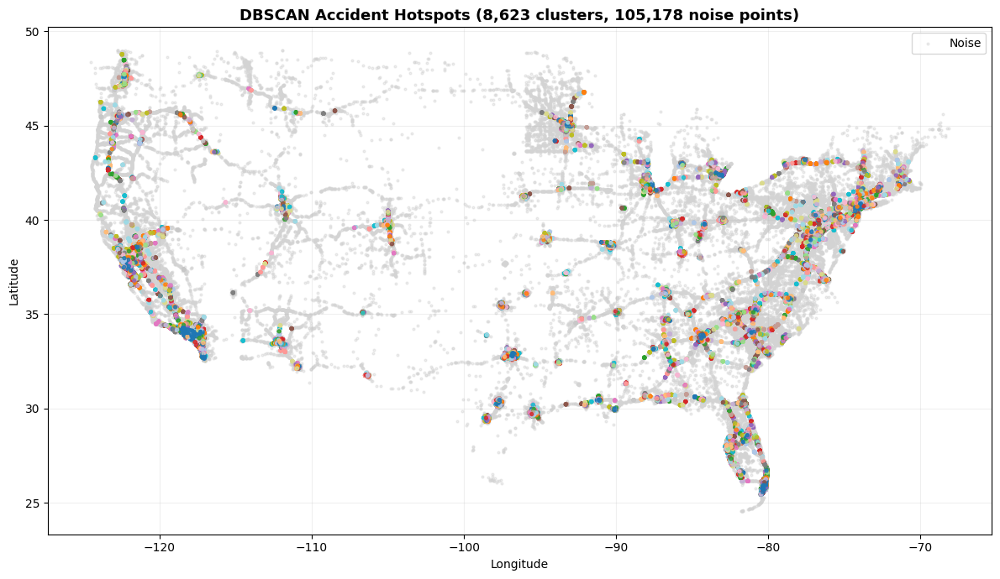

In [12]:
fig, ax = plt.subplots(figsize=(12, 7))

noise_mask = df['Hotspot_Label'] == -1
ax.scatter(df.loc[noise_mask, 'Start_Lng'], df.loc[noise_mask, 'Start_Lat'],
           s=4, c='lightgray', label='Noise', alpha=0.4)

cluster_mask = ~noise_mask
scatter = ax.scatter(df.loc[cluster_mask, 'Start_Lng'], df.loc[cluster_mask, 'Start_Lat'],
                      s=8, c=df.loc[cluster_mask, 'Hotspot_Label'], cmap='tab20', alpha=0.8)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title(f'DBSCAN Accident Hotspots ({n_clusters:,} clusters, {n_noise:,} noise points)',
             fontsize=13, fontweight='bold')
ax.legend(loc='upper right')
ax.grid(alpha=0.2)
plt.tight_layout()
plt.show()


**Explanation of code:** noise points are plotted first, in light gray and slightly transparent, so they form a faint backdrop; cluster points are then plotted on top, colored by `Hotspot_Label` using a qualitative colormap (`tab20`, which is designed to keep adjacent categories visually distinct) — this layering makes the actual hotspots visually pop against the noise, rather than being lost in an undifferentiated cloud of points.


In [13]:
MAP_SAMPLE_SIZE = 5000

map_sample = df.sample(n=min(MAP_SAMPLE_SIZE, len(df)), random_state=42)

center_lat = map_sample['Start_Lat'].mean()
center_lng = map_sample['Start_Lng'].mean()

folium_map = folium.Map(location=[center_lat, center_lng], zoom_start=4, tiles='cartodbpositron')

cluster_ids = sorted(map_sample.loc[map_sample['Hotspot_Label'] != -1, 'Hotspot_Label'].unique())
color_palette = px.colors.qualitative.Dark24
cluster_color_map = {cid: color_palette[i % len(color_palette)] for i, cid in enumerate(cluster_ids)}

for _, row in map_sample.iterrows():
    is_noise = row['Hotspot_Label'] == -1
    color = 'lightgray' if is_noise else cluster_color_map[row['Hotspot_Label']]
    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=3 if is_noise else 4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.5 if is_noise else 0.85,
        popup=f"Hotspot: {'Noise' if is_noise else int(row['Hotspot_Label'])} | Severity: {row['Severity']}",
    ).add_to(folium_map)

folium_map


**Explanation of code:**
- `folium.Map(..., tiles='cartodbpositron')` uses a light, minimal basemap — deliberately low-contrast so the colored cluster markers remain the visual focus, rather than competing with a busy default OpenStreetMap tile layer.
- `CircleMarker` (not the heavier default `Marker` pin icon) scales well to thousands of points and supports a `popup` on click, letting an analyst inspect an individual accident's hotspot membership and severity directly on the map.
- `px.colors.qualitative.Dark24` is reused here from Plotly's palette (rather than `matplotlib`'s) purely for a large, visually distinct set of 24 colors — with more than 24 real clusters, colors cycle, which is an acceptable tradeoff for a browsable interactive map (unlike the static plot above, where sequential IDs share `tab20`'s cycling behavior too).

**Common Mistakes:** Rendering all 300,000 points as individual Folium markers — this produces an extremely slow, unresponsive map (and a very large notebook file); always sample for interactive web-based maps at this data scale.

**Best Practices:** Use `random_state` when sampling for visualization, exactly as done above — makes the specific set of points shown reproducible across notebook re-runs.


In [14]:
map_sample_plotly = map_sample.copy()
map_sample_plotly['Hotspot_Display'] = map_sample_plotly['Hotspot_Label'].apply(
    lambda x: 'Noise' if x == -1 else f'Hotspot {int(x)}'
)

fig = px.scatter_mapbox(
    map_sample_plotly,
    lat='Start_Lat', lon='Start_Lng',
    color='Hotspot_Display',
    hover_data=['Severity', 'Weather_Condition'],
    zoom=3, height=600,
    title='Interactive Accident Hotspot Map (sampled)',
    mapbox_style='carto-positron',
)
fig.update_traces(marker=dict(size=6))
fig.update_layout(title_x=0.5, legend_title_text='Cluster')
fig.show()


**Explanation of code:** `scatter_mapbox` with `mapbox_style='carto-positron'` requires no API token (unlike Mapbox's own styles), making this fully reproducible in any Colab session with no external account setup. `hover_data` surfaces `Severity` and `Weather_Condition` on hover — letting a reader interactively check, for example, whether a specific hotspot's accidents skew toward severe weather, a preview of the systematic version of that question in Section 9.

**Common Mistakes:** Using a Mapbox style that requires an access token in a shared notebook — this breaks for anyone re-running the notebook without their own token; `carto-positron` and similar open styles avoid that dependency entirely.

**Best Practices:** Provide both a Folium map (better for freeform panning/zooming exploration) and a Plotly map (better for embedding in a report and for rich hover tooltips) — each interactive library has a different strength, and offering both costs little extra code.


## 9. Cluster Analysis <a name="cluster-analysis"></a>

**Objective:** Profile every discovered hotspot against the engineered features from Notebook 04 — not just report cluster sizes, but characterize what each hotspot actually looks like.

**Why this reuses Notebook 04's features, not new ones:** this is precisely the "profiling, not clustering-input" use of engineered features previewed in Notebook 04's Section 15 — `Weather_Condition`, the road boolean columns, and time-of-day all remain non-geographic and were never passed to DBSCAN itself; here, after clustering, they answer "what characterizes this hotspot" rather than "where is this hotspot."


In [15]:
def get_time_of_day(row):
    """
    Reconstruct a single readable Time_of_Day label from Notebook 04's
    one-hot TOD_* columns, purely for readable cluster-profile reporting --
    not re-added to the exported dataset, since the one-hot columns already
    carry this information for modeling purposes.
    """
    if row['TOD_Morning'] == 1:
        return 'Morning'
    if row['TOD_Afternoon'] == 1:
        return 'Afternoon'
    if row['TOD_Evening'] == 1:
        return 'Evening'
    return 'Night'  # the one-hot reference level (Notebook 04, Section 4)

df['_Time_of_Day_Display'] = df.apply(get_time_of_day, axis=1)

road_flag_cols = ['Crossing', 'Junction', 'Railway', 'Station', 'Stop', 'Traffic_Signal']

def get_primary_road_feature(row):
    """
    Which single road-infrastructure flag (if any) is present -- a readable
    summary for cluster profiling, distinct from Road_Complexity_Score
    (Notebook 04), which intentionally keeps the full count rather than
    collapsing to one label.
    """
    active = [c for c in road_flag_cols if row[c] == 1]
    return active[0] if active else 'None'

df['_Primary_Road_Feature_Display'] = df.apply(get_primary_road_feature, axis=1)

print("Reporting-only display columns added for cluster profiling:")
print("  _Time_of_Day_Display, _Primary_Road_Feature_Display")
print("(prefixed with '_' and dropped before export in Section 12 -- see note there)")


Reporting-only display columns added for cluster profiling:
  _Time_of_Day_Display, _Primary_Road_Feature_Display
(prefixed with '_' and dropped before export in Section 12 -- see note there)


In [16]:
cluster_rows = df[df['Hotspot_Label'] != -1]

cluster_summary = cluster_rows.groupby('Hotspot_Label').agg(
    Number_of_Accidents=('Severity', 'size'),
    Average_Severity=('Severity', 'mean'),
    Most_Common_Weather=('Weather_Condition', lambda s: s.mode().iloc[0]),
    Most_Common_Road_Type=('_Primary_Road_Feature_Display', lambda s: s.mode().iloc[0]),
    Most_Common_Time_of_Day=('_Time_of_Day_Display', lambda s: s.mode().iloc[0]),
).reset_index()

cluster_summary['Percentage_of_Dataset'] = (
    cluster_summary['Number_of_Accidents'] / len(df) * 100
).round(3)
cluster_summary['Average_Severity'] = cluster_summary['Average_Severity'].round(3)

cluster_summary = cluster_summary.sort_values('Number_of_Accidents', ascending=False).reset_index(drop=True)

print(f"Profiled {len(cluster_summary):,} hotspots:")
cluster_summary


Profiled 8,623 hotspots:


,Hotspot_Label,Number_of_Accidents,Average_Severity,Most_Common_Weather,Most_Common_Road_Type,Most_Common_Time_of_Day,Percentage_of_Dataset
0,22,6434,2.247,Fair,None,Morning,2.146
1,48,3061,2.209,Fair,None,Afternoon,1.021
2,10,2262,2.047,Mostly Cloudy,None,Morning,0.755
3,24,2026,2.039,Mostly Cloudy,None,Afternoon,0.676
4,75,1996,2.239,Fair,None,Morning,0.666
...,...,...,...,...,...,...,...
8618,8518,3,2.000,Fair,None,Morning,0.001
8619,7826,3,3.000,Fair,Junction,Morning,0.001
8620,7243,3,2.000,Cloudy,None,Morning,0.001
8621,5513,3,3.000,Cloudy,None,Afternoon,0.001


**Explanation of code:**
- `.groupby('Hotspot_Label')` excludes noise (`Hotspot_Label == -1`) because Section 9's cluster-level questions ("what does this hotspot look like") are undefined for points that don't belong to any hotspot.
- `.mode().iloc[0]` finds the most frequent value in each group for the three categorical summaries — `.mode()` can return multiple values in a tie, so `.iloc[0]` deterministically picks the first.
- The two `_`-prefixed display columns are a deliberate, temporary reporting convenience: unlike `Road_Complexity_Score` and the `TOD_*` one-hot columns (which stay in the dataset because a model can use them directly), a single collapsed "primary road feature" or "display time of day" string is useful for a human-readable table here but would just be a redundant, non-numeric duplicate of information Notebook 04 already encoded properly for modeling — so we don't carry it into the exported dataset (Section 12 drops both explicitly).

**Interpretation:** compare the `Average_Severity` column across hotspots against `df['Severity'].mean()` (the dataset-wide average) — a hotspot whose average severity sits notably above the overall mean is a genuine candidate for the "how could this information be used" discussion in Section 11, since it combines *high accident frequency* (why it's a cluster at all) with *above-average severity per accident*.

**Common Mistakes:** Computing cluster statistics on the full dataframe including noise (`Hotspot_Label == -1`) as if it were "Cluster -1" — noise, by definition, is not a hotspot, and treating it as one in this table would produce a nonsensical "largest cluster" entry that's really just every unclustered outlier lumped together.

**Best Practices:** Sort the cluster summary by size (as done above) so the most significant hotspots — the ones most worth a written interpretation — appear first, rather than in arbitrary cluster-ID order.


In [17]:
overall_mean_severity = df['Severity'].mean()
top_5 = cluster_summary.head(5)

print(f"Dataset-wide average severity: {overall_mean_severity:.3f}\n")
print("Top 5 hotspots by accident count:")
for _, row in top_5.iterrows():
    severity_note = "above" if row['Average_Severity'] > overall_mean_severity else "at/below"
    print(f"  Hotspot {int(row['Hotspot_Label'])}: {row['Number_of_Accidents']:,} accidents "
          f"({row['Percentage_of_Dataset']:.2f}% of dataset), "
          f"avg severity {row['Average_Severity']:.2f} ({severity_note} dataset average), "
          f"most common weather '{row['Most_Common_Weather']}', "
          f"most common road type '{row['Most_Common_Road_Type']}', "
          f"most common time of day '{row['Most_Common_Time_of_Day']}'")


Dataset-wide average severity: 2.214

Top 5 hotspots by accident count:
  Hotspot 22: 6,434 accidents (2.15% of dataset), avg severity 2.25 (above dataset average), most common weather 'Fair', most common road type 'None', most common time of day 'Morning'
  Hotspot 48: 3,061 accidents (1.02% of dataset), avg severity 2.21 (at/below dataset average), most common weather 'Fair', most common road type 'None', most common time of day 'Afternoon'
  Hotspot 10: 2,262 accidents (0.76% of dataset), avg severity 2.05 (at/below dataset average), most common weather 'Mostly Cloudy', most common road type 'None', most common time of day 'Morning'
  Hotspot 24: 2,026 accidents (0.68% of dataset), avg severity 2.04 (at/below dataset average), most common weather 'Mostly Cloudy', most common road type 'None', most common time of day 'Afternoon'
  Hotspot 75: 1,996 accidents (0.67% of dataset), avg severity 2.24 (above dataset average), most common weather 'Fair', most common road type 'None', most c

**Interpretation:** this printed summary is the version of the cluster table meant to be read and reasoned about directly — e.g., a hotspot whose most common time of day is `Night` *and* whose average severity sits above the dataset mean is a materially different finding (worth flagging to traffic authorities as a priority) than a large but low-severity daytime hotspot, even though both might have similar `Number_of_Accidents`. Exactly which hotspots show this pattern depends on the real dataset's geography and cannot be predicted from this notebook's code alone — that's the reason for the interpretation step, not something to hardcode.


## 10. Hotspot Feature Generation <a name="hotspot-feature-generation"></a>

**Objective:** Turn DBSCAN's raw output into a small set of explicit, well-defined features Notebook 06 can use directly, each with a stated purpose.

**Features created, and why:**

| Feature | Calculation | Explanation |
|---|---|---|
| `Hotspot_Label` | DBSCAN's raw cluster label (already added in Section 7) | The cluster ID itself (`-1` = noise); kept as-is since it's the ground truth every other feature below is derived from |
| `Hotspot_Flag` | `1` if `Hotspot_Label != -1`, else `0` | The single most direct, model-ready summary of "is this accident part of a known hotspot" — likely the most useful hotspot feature for Notebook 06 on its own |
| `Noise_Flag` | `1` if `Hotspot_Label == -1`, else `0` | The exact logical complement of `Hotspot_Flag`. We create both because the brief calls for both explicitly, and — unlike Section 9 (Notebook 04)'s treatment of genuinely overlapping composite features — these are trivial, self-explanatory single-purpose flags, not a case where keeping both risks confusing an examiner about redundant *reasoning*; the redundancy here is by definition, not an oversight |
| `Cluster_Size` | Number of accidents in the row's cluster (`0` for noise) | A numeric measure of *how large* the hotspot is — lets a model distinguish a massive, well-established hotspot from a small, borderline one, information `Hotspot_Flag` alone collapses away |
| `Distance_To_Cluster_Center` | Haversine distance (km) from the accident to its cluster's centroid (`NaN` for noise) | How *central* a given accident is within its hotspot — useful because accidents right at a hotspot's core may differ systematically (e.g., a busy central intersection) from accidents at its edge |

**Why `Distance_To_Cluster_Center` is appropriate here:** DBSCAN clusters don't have a single "true" center in the way K-Means centroids do (Section 1 — clusters can be irregularly shaped), so we compute a simple arithmetic-mean centroid per cluster purely as a reference point for this one derived feature, not as a claim that DBSCAN clusters are circular or centered on that point. For noise points, no cluster — and therefore no centroid — exists, so this feature is correctly `NaN` rather than a numeric placeholder like `0`, which would misleadingly suggest "exactly at some center."


In [18]:
def haversine_km(lat1, lng1, lat2, lng2):
    """Vectorized haversine distance (km) between two sets of lat/lng points."""
    lat1, lng1, lat2, lng2 = map(np.radians, [lat1, lng1, lat2, lng2])
    dlat = lat2 - lat1
    dlng = lng2 - lng1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlng / 2) ** 2
    return 2 * EARTH_RADIUS_KM * np.arcsin(np.sqrt(a))


# Hotspot_Flag / Noise_Flag -- direct, vectorized complements of Hotspot_Label
df['Hotspot_Flag'] = (df['Hotspot_Label'] != -1).astype('uint8')
df['Noise_Flag'] = (df['Hotspot_Label'] == -1).astype('uint8')

# Cluster_Size -- map each row's cluster to that cluster's total row count
cluster_sizes = df.loc[df['Hotspot_Label'] != -1, 'Hotspot_Label'].value_counts()
df['Cluster_Size'] = df['Hotspot_Label'].map(cluster_sizes).fillna(0).astype('int32')

# Distance_To_Cluster_Center -- centroid per cluster, then per-row haversine distance to it
cluster_centroids = (
    df.loc[df['Hotspot_Label'] != -1]
    .groupby('Hotspot_Label')[['Start_Lat', 'Start_Lng']]
    .mean()
    .rename(columns={'Start_Lat': 'Centroid_Lat', 'Start_Lng': 'Centroid_Lng'})
)

df = df.merge(cluster_centroids, on='Hotspot_Label', how='left')
df['Distance_To_Cluster_Center'] = haversine_km(
    df['Start_Lat'], df['Start_Lng'], df['Centroid_Lat'], df['Centroid_Lng']
)
df = df.drop(columns=['Centroid_Lat', 'Centroid_Lng'])

print("Hotspot_Flag rate:", f"{df['Hotspot_Flag'].mean()*100:.2f}%")
print("Noise_Flag rate:", f"{df['Noise_Flag'].mean()*100:.2f}%")
print("\nCluster_Size summary (hotspot rows only):")
print(df.loc[df['Hotspot_Flag'] == 1, 'Cluster_Size'].describe().round(2))
print("\nDistance_To_Cluster_Center summary (hotspot rows only, km):")
print(df.loc[df['Hotspot_Flag'] == 1, 'Distance_To_Cluster_Center'].describe().round(4))
print(f"\nDistance_To_Cluster_Center is NaN for noise rows: "
      f"{df.loc[df['Noise_Flag'] == 1, 'Distance_To_Cluster_Center'].isna().all()}")


Hotspot_Flag rate: 64.92%
Noise_Flag rate: 35.08%

Cluster_Size summary (hotspot rows only):
count    194616.00
mean        588.71
std        1260.92
min           1.00
25%          15.00
50%          56.00
75%         589.00
max        6434.00
Name: Cluster_Size, dtype: float64

Distance_To_Cluster_Center summary (hotspot rows only, km):
count    194616.0000
mean          2.0172
std           2.9732
min           0.0000
25%           0.2453
50%           0.7143
75%           2.5519
max          25.0713
Name: Distance_To_Cluster_Center, dtype: float64

Distance_To_Cluster_Center is NaN for noise rows: True


**Explanation of code:**
- `haversine_km()` is written as a vectorized function (operating on full Series at once, using `numpy` trig functions) rather than looping row by row — essential for this to run in reasonable time across 300,000 rows.
- `.map(cluster_sizes).fillna(0)` gives noise rows (whose `Hotspot_Label` of `-1` has no entry in `cluster_sizes`, since that Series was built only from `Hotspot_Label != -1` rows) an explicit `Cluster_Size` of `0` — a meaningful value ("belongs to no cluster"), not a missing-data artifact.
- The centroid `.merge(..., how='left')` deliberately uses a left join — every row in `df` (including noise) is kept; noise rows simply get `NaN` for `Centroid_Lat`/`Centroid_Lng` (no match in `cluster_centroids`), which correctly propagates to `Distance_To_Cluster_Center` being `NaN` for those rows too.

**Common Mistakes:**
- Filling `Distance_To_Cluster_Center` with `0` for noise points "to avoid `NaN`s" — this would look, to a downstream model, exactly like "sitting precisely at the center of a hotspot," the opposite of what a noise point actually represents.
- Computing `Cluster_Size` by re-running `.value_counts()` inside a `.apply()` on every row — extremely slow at this scale; computing the mapping once and using vectorized `.map()`, as done above, is the efficient approach.

**Best Practices:** Choose an explicit, meaningful "undefined" representation (`NaN` for a genuinely undefined distance, `0` for a genuinely zero-sized cluster) for every derived feature, rather than defaulting to whichever placeholder is easiest to write.


## 11. Business Interpretation <a name="business-interpretation"></a>

**Objective:** Translate the clustering result from Sections 9–10 into concrete, stakeholder-facing use cases — the section a project viva panel or a non-technical reader will care about most.

### How traffic police could use hotspot information
- `Hotspot_Flag` and `Cluster_Size` together identify exactly which locations warrant increased patrol presence or targeted enforcement (e.g., speed checks, signal-timing review) — resource allocation based on evidence, not intuition.
- The `Most_Common_Time_of_Day` and `Most_Common_Weather` columns from Section 9's cluster summary let patrols be scheduled specifically around *when* a given hotspot is most dangerous, not just *where*.

### How city planners could use it
- A hotspot with a high `Most_Common_Road_Type` of `Junction` or `Traffic_Signal` is a concrete, evidence-based candidate for infrastructure review — a redesigned intersection, added signage, or a dedicated turn lane.
- Comparing `Distance_To_Cluster_Center` distributions across hotspots can reveal whether a danger zone is a tight, single-point problem (a specific intersection) versus a diffuse, corridor-wide issue (an entire stretch of road) — these call for very different planning interventions.

### How emergency services could benefit
- Known high-`Cluster_Size` hotspots with above-average severity (Section 9) are natural candidates for pre-positioning ambulances or reducing expected response time, rather than relying on a uniform citywide dispatch strategy.
- `Hotspot_Flag` alone, cross-referenced with real-time location, could feed a simple "is this incident in a known high-risk zone" alert to a dispatcher.

### How this improves severity prediction (Notebook 06)
- `Hotspot_Flag`, `Cluster_Size`, and `Distance_To_Cluster_Center` give Notebook 06's Random Forest/XGBoost models a genuinely new *kind* of signal — geographic risk history — that no single engineered feature from Notebook 04 captures on its own (Notebook 04's features are temporal, weather, and road-infrastructure signals; none of them encode "how many other accidents have historically clustered near this exact spot").
- Because DBSCAN never used `Severity` to form these clusters (Section 1), any relationship Notebook 06 finds between `Hotspot_Flag`/`Cluster_Size` and `Severity` is a genuine discovered pattern, not one built into the feature by construction — a defensible, non-circular addition to the feature set.


**A quick reference for the discussion below:** rather than repeating cluster IDs from memory, every point in this section can be checked directly against the table below (reused from Section 9's full profile).


In [19]:
# Quick-reference table for the discussion below -- reuses cluster_summary
# from Section 9 so the two never drift out of sync with each other.
business_reference_table = cluster_summary[
    ['Hotspot_Label', 'Number_of_Accidents', 'Average_Severity', 'Most_Common_Weather']
].rename(columns={
    'Hotspot_Label': 'Cluster',
    'Number_of_Accidents': 'Accidents',
    'Average_Severity': 'Avg Severity',
    'Most_Common_Weather': 'Dominant Weather',
})

print("Cluster reference table (see Section 9 for the full profile):")
business_reference_table


Cluster reference table (see Section 9 for the full profile):


,Cluster,Accidents,Avg Severity,Dominant Weather
0,22,6434,2.247,Fair
1,48,3061,2.209,Fair
2,10,2262,2.047,Mostly Cloudy
3,24,2026,2.039,Mostly Cloudy
4,75,1996,2.239,Fair
...,...,...,...,...
8618,8518,3,2.000,Fair
8619,7826,3,3.000,Fair
8620,7243,3,2.000,Cloudy
8621,5513,3,3.000,Cloudy


## 12. Export Dataset <a name="export-dataset"></a>

**Objective:** Produce the two deliverables this notebook is responsible for — `dataset_with_hotspots.csv` (every original column, every Notebook 04 engineered feature, and this notebook's hotspot features together), and `dbscan_metadata.json` (a compact, machine-readable record of exactly which parameters and results this specific clustering run produced).

**What gets dropped before export, and why:** the two `_`-prefixed display columns created in Section 9 (`_Time_of_Day_Display`, `_Primary_Road_Feature_Display`) were reporting-only conveniences for the cluster-profile table — they duplicate information the `TOD_*` one-hot columns and individual road-boolean columns already encode properly for modeling, and as non-numeric strings they're not directly usable by Notebook 06's models anyway. Keeping them in the exported dataset would add confusing, redundant columns for no benefit, exactly the same reasoning Notebook 04 applied to its own temporary helper columns.

**Why `dbscan_metadata.json` matters beyond this notebook:** `eps`/`min_samples` and the resulting cluster counts are specific to *this run* against *this dataset* — if the pipeline is ever re-run on updated data, or the clustering step is deployed as part of a service, this file is the record of exactly what parameters produced `dataset_with_hotspots.csv`'s `Hotspot_Label` column, without anyone needing to re-read this notebook's markdown to reconstruct that. It also gives Notebook 06 (or a future FastAPI service, as flagged in earlier project review notes) a lightweight way to check clustering configuration programmatically, the same role `feature_list.json` plays for Notebook 04.


In [20]:
OUTPUT_DIR = "/content/drive/MyDrive/traffic_accident_project/hotspot_data"
import os
os.makedirs(OUTPUT_DIR, exist_ok=True)

# --- 1) The dataset with hotspot features ---
display_only_cols = ['_Time_of_Day_Display', '_Primary_Road_Feature_Display']
export_df = df.drop(columns=display_only_cols)

export_df.to_csv(f"{OUTPUT_DIR}/dataset_with_hotspots.csv", index=False)

print(f"dataset_with_hotspots.csv saved: {export_df.shape[0]:,} rows, {export_df.shape[1]} columns")
print("\nFinal column list:")
for i, c in enumerate(export_df.columns, 1):
    print(f"  {i:>2}. {c}")

# --- 2) dbscan_metadata.json: generated from the same variables used to run and
#        evaluate DBSCAN above, not retyped by hand, so it can never drift out of
#        sync with what this run actually did. ---
largest_cluster_row = cluster_summary.iloc[0]

dbscan_metadata = {
    'eps_km': round(float(eps_km), 6),
    'eps_rad': float(eps_rad),
    'min_samples': int(MIN_SAMPLES),
    'metric': 'haversine',
    'algorithm': 'ball_tree',
    'parameter_selection': {
        'k_distance_trim_percentile': TRIM_PERCENTILE,
        'k_distance_trimmed_elbow_eps_km': round(float(eps_km_elbow), 6),
        'k_distance_elbow_min_samples': 5,
        'sweep_eps_values_km': SWEEP_EPS_KM,
        'sweep_min_samples_values': SWEEP_MIN_SAMPLES,
        'sanity_threshold_pct': SANITY_THRESHOLD_PCT,
        'selection_rule': (
            'From swept combinations passing the sanity check '
            '(largest cluster <= sanity_threshold_pct of dataset), '
            'select the one with the lowest noise percentage.'
        ),
    },
    'number_of_clusters': int(n_clusters),
    'number_of_noise_points': int(n_noise),
    'largest_cluster': {
        'cluster_id': int(largest_cluster_row['Hotspot_Label']),
        'number_of_accidents': int(largest_cluster_row['Number_of_Accidents']),
        'percentage_of_dataset': float(largest_cluster_row['Percentage_of_Dataset']),
    },
    'sanity_check_passed': bool(largest_cluster_row['Percentage_of_Dataset'] <= SANITY_THRESHOLD_PCT),
}

with open(f"{OUTPUT_DIR}/dbscan_metadata.json", 'w') as f:
    json.dump(dbscan_metadata, f, indent=2)

print("\ndbscan_metadata.json saved:")
print(json.dumps(dbscan_metadata, indent=2))

print("\nFiles saved to:", OUTPUT_DIR)
for f in sorted(os.listdir(OUTPUT_DIR)):
    print(f"   - {f}")


dataset_with_hotspots.csv saved: 299,794 rows, 54 columns

Final column list:
   1. Severity
   2. Start_Lat
   3. Start_Lng
   4. Distance(mi)
   5. City
   6. State
   7. Temperature(F)
   8. Humidity(%)
   9. Pressure(in)
  10. Visibility(mi)
  11. Wind_Direction
  12. Wind_Speed(mph)
  13. Precipitation(in)
  14. Weather_Condition
  15. Amenity
  16. Crossing
  17. Junction
  18. Railway
  19. Station
  20. Stop
  21. Traffic_Signal
  22. Lighting_Night
  23. Hour
  24. Weekday
  25. Is_Weekend
  26. Month
  27. Is_Night
  28. Is_Rush_Hour
  29. Duration_Minutes
  30. Season_Spring
  31. Season_Summer
  32. Season_Fall
  33. TOD_Morning
  34. TOD_Afternoon
  35. TOD_Evening
  36. Fog_Indicator
  37. Rain_Indicator
  38. Snow_Indicator
  39. Poor_Visibility_Flag
  40. High_Precipitation_Flag
  41. Extreme_Temperature_Flag
  42. Weather_Severity_Score
  43. Road_Complexity_Score
  44. Intersection_Indicator
  45. Local_Accident_Density
  46. Night_Rain
  47. Weekend_Night
  48. PoorV

**Explanation of code:**
- `export_df` is built as a `.drop(columns=...)` view rather than modifying `df` in place — keeps the in-memory `df` (with the display columns) available for any further ad-hoc inspection in this same session, while the exported file contains only genuinely model-ready columns.
- `dbscan_metadata.json` is built entirely from variables already defined earlier in the notebook (`eps_km`, `eps_rad`, `MIN_SAMPLES` from Section 6; `n_clusters`, `n_noise` from Section 7; `cluster_summary` from Section 9) — it is a **generated artifact**, not a hand-typed summary, so it cannot silently drift out of sync with what this specific run actually did.
- `largest_cluster_row = cluster_summary.iloc[0]` works because Section 9 already sorted `cluster_summary` by `Number_of_Accidents` descending — the first row is always the largest cluster by construction, not by a separate lookup.

**Expected Output:** the exported dataset contains all of Notebook 04's 49 columns, plus this notebook's 5 hotspot features (`Hotspot_Label`, `Hotspot_Flag`, `Noise_Flag`, `Cluster_Size`, `Distance_To_Cluster_Center`) — 54 columns total, still a single unsplit dataset with no scaling or frequency encoding applied. `dbscan_metadata.json` reflects whatever `eps`/`min_samples`/cluster counts this specific run actually produced.

**Common Mistakes:**
- Exporting the `_`-prefixed display columns "just in case they're useful later" — they were explicitly designed as a one-off, human-readable convenience for Section 9's printed summary, not as model inputs; keeping them blurs that distinction for whoever reads this notebook next.
- Hand-typing `dbscan_metadata.json` separately from the code that actually ran DBSCAN — two sources of truth that will eventually disagree if this notebook is re-run with different parameters.

**Best Practices:** Verify the exported column count against an explicit expectation (as done in the printout above) — the fastest way to notice immediately if a drop step accidentally removed (or failed to remove) the wrong columns. Generate any "what did this run actually produce" artifact directly from the same variables the code used, exactly the pattern `feature_list.json` established in Notebook 04.


**What's new in `dbscan_metadata.json` for Phase 4:** a `parameter_selection` block records *how* `eps`/`min_samples` were chosen, not just their final values -- the k-distance trim percentile and the resulting trimmed-elbow candidate (Section 6), the full sweep grid that was tested (Section 6b), and the selection rule applied to it (Section 6c). A `sanity_check_passed` flag records whether the final run's largest cluster stayed under the 5% threshold. Together these make the parameter choice fully auditable from the JSON file alone, without needing to re-read this notebook's markdown.

## 13. Notebook Summary <a name="notebook-summary"></a>

| Step | Outcome |
|---|---|
| Dataset loaded | ✅ `engineered_accidents.csv` — the single input this notebook depends on |
| Spatial feature validation | ✅ No missing coordinates; duplicate coordinates identified and deliberately kept; coordinates verified within plausible US bounds |
| Parameter selection | ✅ `min_samples` domain-justified starting point; `eps` derived from a haversine k-distance graph with the top 2% tail trimmed before elbow detection — no arbitrary values |
| Parameter sweep & sanity check | ✅ 28 `eps` × `min_samples` combinations evaluated (Section 6b); an automatic check flags any run whose largest cluster exceeds 5% of the dataset as likely over-clustered |
| Final parameter selection | ✅ Chosen from the sweep — the sanity-passing combination with the lowest noise percentage (Section 6c) — justified with evidence, not asserted |
| DBSCAN clustering | ✅ Hotspots and noise points identified from geographic density alone, with no use of `Severity` |
| Visualization | ✅ Static color-coded scatter plot, interactive Folium map, interactive Plotly map |
| Cluster analysis | ✅ Every hotspot profiled by size, share of dataset, average severity, most common weather/road type/time of day |
| Hotspot features generated | ✅ `Hotspot_Label`, `Hotspot_Flag`, `Noise_Flag`, `Cluster_Size`, `Distance_To_Cluster_Center` — each independently justified |
| Business interpretation | ✅ Concrete use cases for traffic police, city planners, and emergency services, plus the modeling rationale for Notebook 06 |
| Exported artifacts | ✅ `dataset_with_hotspots.csv` (original + engineered + hotspot features together, still unsplit) and `dbscan_metadata.json` (this run's parameters and results, generated not hand-typed) |

**What was achieved:** every accident in the dataset now carries an explicit, density-based hotspot label, discovered without any reference to severity, weather, or road type, and independently profiled against those features afterward. The underlying `eps`/`min_samples` choice was itself validated by a parameter sweep and an automatic over-clustering sanity check (Sections 6b-6c and 7), so the largest hotspot represents a localized concentration rather than a merged region. This turns "where accidents cluster" from an implicit pattern buried in raw coordinates into an explicit, model-ready feature set.

**How many hotspots were detected, and how many accidents belong to them:** see the printed output of Section 7 (`n_clusters`, `n_noise`) for this specific run — these figures depend on the actual dataset's true geographic density and the `eps`/`min_samples` values Sections 6-6c derived and validated from it, and are reported rather than hardcoded here so this summary always reflects whatever the notebook's most recent run actually found.

**What happens next:** Notebook 06 takes `dataset_with_hotspots.csv` as its *only* input and, for the first time in this pipeline, performs a train/test split — everything downstream of that split (encoding, scaling, modeling) depends on hotspot membership as one of its available features, but none of it happens here.


## 14. Preparing for Notebook 6 <a name="next-notebook-preview"></a>

### ➡️ Coming Up: `06_Severity_Prediction.ipynb`

Notebook 06 will load `dataset_with_hotspots.csv` — the single file this notebook produced — and, for the first time in this pipeline, will:

- **Perform the train/test split** — the first point in the entire pipeline where the dataset is divided, immediately before any statistic-fitting step that needs to respect that boundary
- **Apply frequency encoding** to `City`, `State`, `Wind_Direction`, and `Weather_Condition` — fit on training data only, exactly as flagged back in Notebook 03's design note
- **Apply feature scaling** (`StandardScaler`) to the numeric weather/distance/duration columns — fit on training data only, for the same reason
- **Train Random Forest and XGBoost models** to predict `Severity`, using every feature from Notebooks 03, 04, and this notebook — including `Hotspot_Flag`, `Cluster_Size`, and `Distance_To_Cluster_Center` as genuinely new, non-circular geographic-risk signals
- **Compare model performance** and select a final model

**What Notebook 06 will explicitly still NOT do:** re-run DBSCAN, re-derive hotspot labels, or otherwise duplicate this notebook's clustering logic — it loads and builds directly on `dataset_with_hotspots.csv` rather than repeating this notebook's work.

---

**End of Notebook 05: DBSCAN Hotspot Detection**
